# FLIGHT PRICE PREDICTION 

Anyone who has booked a flight ticket knows how unexpectedly the prices vary. The cheapest available ticket on a given flight gets more and less expensive over time. This usually happens as an attempt to maximize revenue based on 

1. Time of purchase patterns (making sure last-minute purchases are expensive) 
2. Keeping the flight as full as they want it (raising prices on a flight which is filling up in order to reduce sales and hold back inventory for those expensive last-minute expensive purchases) 

So, you have to work on a project where you collect data of flight fares with other features and work to make a model to predict fares of flights.

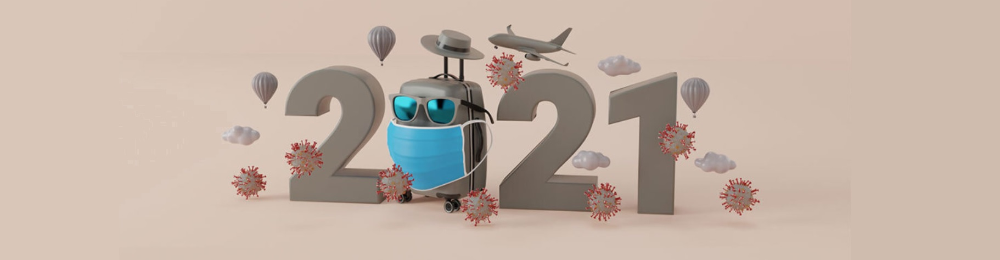

### Data Analysis
After cleaning the data, you have to do some analysis on the data. 
- Do airfares change frequently? 
- Do they move in small increments or in large jumps? 
- Do they tend to go up or down over time? 
- What is the best time to buy so that the consumer can save the most by taking the least risk? 
- Does price increase as we get near to departure date? 
- Is Indigo cheaper than Jet Airways? 
- Are morning flights expensive?

### Model Building
After collecting the data, you need to build a machine learning model. Before model building do all data pre-processing steps. Try different models with different hyper parameters and select the best model. Follow the complete life cycle of data science. Include all the steps below:
1. Data Cleaning
2. Exploratory Data Analysis
3. Data Pre-processing
4. Model Building
5. Model Evaluation
6. Selecting the best model

In [1]:
import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")
import joblib

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import missingno
import pandas_profiling
from sklearn import metrics
from scipy.stats import zscore
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

Importing all the necessary libraries/dependencies here.

In [2]:
df = pd.read_csv("C:\\Users\\aswin\\OneDrive\\Desktop\\aswin\\project\\Flight_Price_Data.csv")

I am importing the collected dataset comma separated values file and storing it into our dataframe for further usage.

In [3]:
df # checking the first 5 and last 5 rows

,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices
0,Air Asia,12:40,20:15,7h 35m,New Delhi,Mumbai,No Meal Fare,1 Stop,"5,953"
1,Air Asia,11:55,20:15,8h 20m,New Delhi,Mumbai,No Meal Fare,1 Stop,"5,953"
2,Air Asia,16:15,06:20,14h 05m,New Delhi,Mumbai,No Meal Fare,1 Stop,"5,953"
3,Go First,18:50,20:45,1h 55m,New Delhi,Mumbai,No Meal Fare,Non Stop,"5,954"
4,Go First,09:05,11:05,2h 00m,New Delhi,Mumbai,No Meal Fare,Non Stop,"5,954"
...,...,...,...,...,...,...,...,...,...
5800,Air India,08:55,08:20,23h 25m,Lucknow,Jaipur,No Meal Fare,1 Stop,"9,302"
5801,Air India,08:55,09:20,24h 25m,Lucknow,Jaipur,No Meal Fare,2 Stop(s),"16,287"
5802,Air India,14:45,09:20,18h 35m,Lucknow,Jaipur,No Meal Fare,2 Stop(s),"16,865"
5803,Air India,08:55,09:20,24h 25m,Lucknow,Jaipur,No Meal Fare,2 Stop(s),"16,865"


Here we are taking a look at the first 5 and last 5 rows of our dataset. It shows that we have a total of 5805 rows and 9 columns present in our dataframe. In the above cell we can see our dataset includes a target label "Flight_Prices" column and the remaining feature columns can be used to determine or help in predicting the price of the flights for different places. Since price is a continous value it makes this to be a Regression problem!

# Exploratory Data Analysis (EDA)

In [4]:
print("We have {} Rows and {} Columns in our dataframe".format(df.shape[0], df.shape[1]))
df.head(10)

We have 5805 Rows and 9 Columns in our dataframe


,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices
0,Air Asia,12:40,20:15,7h 35m,New Delhi,Mumbai,No Meal Fare,1 Stop,"5,953"
1,Air Asia,11:55,20:15,8h 20m,New Delhi,Mumbai,No Meal Fare,1 Stop,"5,953"
2,Air Asia,16:15,06:20,14h 05m,New Delhi,Mumbai,No Meal Fare,1 Stop,"5,953"
3,Go First,18:50,20:45,1h 55m,New Delhi,Mumbai,No Meal Fare,Non Stop,"5,954"
4,Go First,09:05,11:05,2h 00m,New Delhi,Mumbai,No Meal Fare,Non Stop,"5,954"
5,Go First,06:15,08:20,2h 05m,New Delhi,Mumbai,eCash 250,Non Stop,"5,954"
6,Go First,14:20,16:25,2h 05m,New Delhi,Mumbai,eCash 250,Non Stop,"5,954"
7,Go First,20:30,22:35,2h 05m,New Delhi,Mumbai,eCash 250,Non Stop,"5,954"
8,Go First,22:45,01:00,2h 15m,New Delhi,Mumbai,eCash 250,Non Stop,"5,954"
9,Go First,17:45,22:25,4h 40m,New Delhi,Mumbai,No Meal Fare,1 Stop,"5,954"


**Column Description:**

- Airline_Names : This shows the list of all the Airline Names for which the data got scraped
- Departure_Time : In this column we have the timings of every flight departure
- Arrival_Time : Here in this column we have the timings of every flight arrival
- Flight_Duration : We can see the total duration of a flight that it took to fly from the source to the destination
- Source_Place : Gives us the name of the source place where the flight journey began
- Destination_Place : Shows us the name of the destination place where the flight journey ended
- Meal_Availability : Provides us with the information on type of meal that the passenger is eligible for
- Number_Of_Stops : Lists the number of stops the flight is going to take to complete the entire journey
- Flight_Prices : Finally we have our label column that has the ticket prices for the aircraft journey

In [5]:
df.isna().sum() # checking for missing values

Airline_Names        0
Departure_Time       0
Arrival_Time         0
Flight_Duration      0
Source_Place         0
Destination_Place    0
Meal_Availability    0
Number_Of_Stops      0
Flight_Prices        0
dtype: int64

Great we have no missing values therefore we won't have to worry about handling missing data. However we will try to confirm the same information with a visual on it.

<AxesSubplot:>

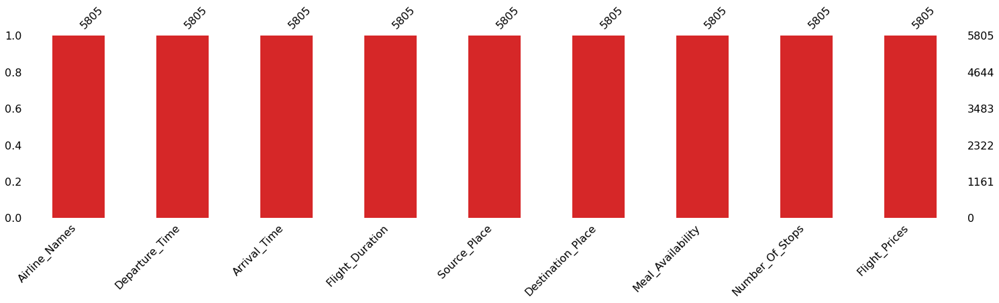

In [6]:
missingno.bar(df, figsize = (25,5), color="tab:red")

Was just ensuring the missing data information with the help of a visual. Looks like none of the columns in our dataset has any null value present in them.

In [7]:
print("Missing column values in percentage:")
for col in df:
    percentage = np.round((df[col].isnull().sum()/df.shape[0])*100, 6)
    print(col, ":".format(), percentage, '%')

Missing column values in percentage:
Airline_Names : 0.0 %
Departure_Time : 0.0 %
Arrival_Time : 0.0 %
Flight_Duration : 0.0 %
Source_Place : 0.0 %
Destination_Place : 0.0 %
Meal_Availability : 0.0 %
Number_Of_Stops : 0.0 %
Flight_Prices : 0.0 %


Was taking a look at the missing data percentage post visual to ensure there are no empty records.

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5805 entries, 0 to 5804
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Airline_Names      5805 non-null   object
 1   Departure_Time     5805 non-null   object
 2   Arrival_Time       5805 non-null   object
 3   Flight_Duration    5805 non-null   object
 4   Source_Place       5805 non-null   object
 5   Destination_Place  5805 non-null   object
 6   Meal_Availability  5805 non-null   object
 7   Number_Of_Stops    5805 non-null   object
 8   Flight_Prices      5805 non-null   object
dtypes: object(9)
memory usage: 408.3+ KB


Using the `info` method we are able to confirm the non null count details as well as the datatype information. We have all 9 columns showing as object datatype therefore some data cleaning is required to fix those details.

In [9]:
df.nunique().sort_values().to_frame("Unique Values")

,Unique Values
Meal_Availability,3
Number_Of_Stops,5
Airline_Names,6
Source_Place,9
Destination_Place,9
Departure_Time,223
Arrival_Time,232
Flight_Duration,409
Flight_Prices,1571


With the help of `nunique` and `sort_values` methods we can see the number of unique values present in each of the columns of our dataset.

In [10]:
value = ["Meal_Availability", "Number_Of_Stops", "Airline_Names", "Source_Place", "Destination_Place"]
for col in value:
    print(col)
    print(df[col].value_counts())
    print("="*120)

Meal_Availability
No Meal Fare    4252
Free Meal       1014
eCash 250        539
Name: Meal_Availability, dtype: int64
Number_Of_Stops
1 Stop       3696
2 Stop(s)    1154
Non Stop      693
3 Stop(s)     244
4 Stop(s)      18
Name: Number_Of_Stops, dtype: int64
Airline_Names
IndiGo       1782
Air India    1638
Vistara      1514
Go First      492
Air Asia      213
SpiceJet      166
Name: Airline_Names, dtype: int64
Source_Place
Mumbai       806
Bangalore    755
New Delhi    748
Kolkata      744
Hyderabad    614
Goa          612
Chennai      580
Lucknow      519
Jaipur       427
Name: Source_Place, dtype: int64
Destination_Place
Mumbai       805
Bangalore    786
Hyderabad    759
New Delhi    727
Kolkata      710
Chennai      648
Goa          545
Lucknow      521
Jaipur       304
Name: Destination_Place, dtype: int64


I have listed the unique value information for the columns "Meal_Availability", "Number_Of_Stops", "Airline_Names", "Source_Place" and "Destination_Place" to see the values as they contain less than 10 unique values in those columns. This also shows that atleast in these columns we do not have to worry about any junk data being present.

# Data Preprocessing

In [11]:
# Meal_Availability 

df.Meal_Availability.replace({"No Meal Fare": "No Meals", "Free Meal": "Free Meals", "eCash 250": "eCash Meals"}, 
                             inplace = True)
df["Meal_Availability"].value_counts()

No Meals       4252
Free Meals     1014
eCash Meals     539
Name: Meal_Availability, dtype: int64

First we are renaming the "Meal_Availability" column values to ensure that I have information clearer to my understanding.

In [12]:
# Number_Of_Stops

df.Number_Of_Stops.replace({"Non Stop": 0, "1 Stop": 1, "2 Stop(s)": 2, "3 Stop(s)": 3, "4 Stop(s)": 4}, 
                           inplace = True)
df["Number_Of_Stops"].value_counts()

1    3696
2    1154
0     693
3     244
4      18
Name: Number_Of_Stops, dtype: int64

Now we are changing the object datatype "Number_Of_Stops" column to integer values by giving them the numeric stops values instead of a descriptive one.

In [13]:
df

,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices
0,Air Asia,12:40,20:15,7h 35m,New Delhi,Mumbai,No Meals,1,"5,953"
1,Air Asia,11:55,20:15,8h 20m,New Delhi,Mumbai,No Meals,1,"5,953"
2,Air Asia,16:15,06:20,14h 05m,New Delhi,Mumbai,No Meals,1,"5,953"
3,Go First,18:50,20:45,1h 55m,New Delhi,Mumbai,No Meals,0,"5,954"
4,Go First,09:05,11:05,2h 00m,New Delhi,Mumbai,No Meals,0,"5,954"
...,...,...,...,...,...,...,...,...,...
5800,Air India,08:55,08:20,23h 25m,Lucknow,Jaipur,No Meals,1,"9,302"
5801,Air India,08:55,09:20,24h 25m,Lucknow,Jaipur,No Meals,2,"16,287"
5802,Air India,14:45,09:20,18h 35m,Lucknow,Jaipur,No Meals,2,"16,865"
5803,Air India,08:55,09:20,24h 25m,Lucknow,Jaipur,No Meals,2,"16,865"


Here I am taking a look at the first 5 and last 5 records in our dataset after altering the "Meal_Availability" and "Number_Of_Stops" columns respectively.

In [14]:
# Departure_Time

df["Dep_Hour"] = pd.to_datetime(df.Departure_Time, format="%H:%M").dt.hour
df["Dep_Min"] = pd.to_datetime(df.Departure_Time, format="%H:%M").dt.minute
df["Departure_Time"] = df['Dep_Hour'] + df['Dep_Min'] / 60
#df.drop(columns = ['Dep_Hour','Dep_Min'], inplace=True) 
df.head()

,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices,Dep_Hour,Dep_Min
0,Air Asia,12.666667,20:15,7h 35m,New Delhi,Mumbai,No Meals,1,"5,953",12,40
1,Air Asia,11.916667,20:15,8h 20m,New Delhi,Mumbai,No Meals,1,"5,953",11,55
2,Air Asia,16.250000,06:20,14h 05m,New Delhi,Mumbai,No Meals,1,"5,953",16,15
3,Go First,18.833333,20:45,1h 55m,New Delhi,Mumbai,No Meals,0,"5,954",18,50
4,Go First,9.083333,11:05,2h 00m,New Delhi,Mumbai,No Meals,0,"5,954",9,5


Now I am converting the object data type "Departure_Time" column to float using the datetime functionality.

In [15]:
# Arrival_Time

df["Arr_Hour"] = pd.to_datetime(df.Arrival_Time, format="%H:%M").dt.hour
df["Arr_Min"] = pd.to_datetime(df.Arrival_Time, format="%H:%M").dt.minute
df["Arrival_Time"] = df['Arr_Hour'] + df['Arr_Min'] / 60
#df.drop(columns = ['Arr_Hour','Arr_Min'], inplace=True)  
df.head()

,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices,Dep_Hour,Dep_Min,Arr_Hour,Arr_Min
0,Air Asia,12.666667,20.250000,7h 35m,New Delhi,Mumbai,No Meals,1,"5,953",12,40,20,15
1,Air Asia,11.916667,20.250000,8h 20m,New Delhi,Mumbai,No Meals,1,"5,953",11,55,20,15
2,Air Asia,16.250000,6.333333,14h 05m,New Delhi,Mumbai,No Meals,1,"5,953",16,15,6,20
3,Go First,18.833333,20.750000,1h 55m,New Delhi,Mumbai,No Meals,0,"5,954",18,50,20,45
4,Go First,9.083333,11.083333,2h 00m,New Delhi,Mumbai,No Meals,0,"5,954",9,5,11,5


Here I am converting the object data type "Arrival_Time" column to float using the datetime functionality.

In [16]:
# Flight_Duration

df["FD_Hour"] = df.Flight_Duration.str.split('h').str.get(0)
df["FD_Min"] = df.Flight_Duration.str.split('h').str.get(1)
df["FD_Min"] = df["FD_Min"].str.split('m').str.get(0)
df["FD_Hour"] = df['FD_Hour'].astype('float')
df["FD_Min"] = df['FD_Min'].astype('float')
df["Flight_Duration"] = df["FD_Hour"] + df["FD_Min"] / 60
#df.drop(columns = ["FD_Hour","FD_Min"], inplace=True)
df.head()

,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices,Dep_Hour,Dep_Min,Arr_Hour,Arr_Min,FD_Hour,FD_Min
0,Air Asia,12.666667,20.250000,7.583333,New Delhi,Mumbai,No Meals,1,"5,953",12,40,20,15,7.0,35.0
1,Air Asia,11.916667,20.250000,8.333333,New Delhi,Mumbai,No Meals,1,"5,953",11,55,20,15,8.0,20.0
2,Air Asia,16.250000,6.333333,14.083333,New Delhi,Mumbai,No Meals,1,"5,953",16,15,6,20,14.0,5.0
3,Go First,18.833333,20.750000,1.916667,New Delhi,Mumbai,No Meals,0,"5,954",18,50,20,45,1.0,55.0
4,Go First,9.083333,11.083333,2.000000,New Delhi,Mumbai,No Meals,0,"5,954",9,5,11,5,2.0,0.0


Again I have used the datetime functionality to convert "Flight_Duration" column from object data type to float data type and removed the unwanted letters "h" and "m" from the values.

In [17]:
# Flight_Prices

df['Flight_Prices'] = df['Flight_Prices'].str.replace(',','')
df['Flight_Prices'] = df['Flight_Prices'].astype('float')
df

,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices,Dep_Hour,Dep_Min,Arr_Hour,Arr_Min,FD_Hour,FD_Min
0,Air Asia,12.666667,20.250000,7.583333,New Delhi,Mumbai,No Meals,1,5953.0,12,40,20,15,7.0,35.0
1,Air Asia,11.916667,20.250000,8.333333,New Delhi,Mumbai,No Meals,1,5953.0,11,55,20,15,8.0,20.0
2,Air Asia,16.250000,6.333333,14.083333,New Delhi,Mumbai,No Meals,1,5953.0,16,15,6,20,14.0,5.0
3,Go First,18.833333,20.750000,1.916667,New Delhi,Mumbai,No Meals,0,5954.0,18,50,20,45,1.0,55.0
4,Go First,9.083333,11.083333,2.000000,New Delhi,Mumbai,No Meals,0,5954.0,9,5,11,5,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5800,Air India,8.916667,8.333333,23.416667,Lucknow,Jaipur,No Meals,1,9302.0,8,55,8,20,23.0,25.0
5801,Air India,8.916667,9.333333,24.416667,Lucknow,Jaipur,No Meals,2,16287.0,8,55,9,20,24.0,25.0
5802,Air India,14.750000,9.333333,18.583333,Lucknow,Jaipur,No Meals,2,16865.0,14,45,9,20,18.0,35.0
5803,Air India,8.916667,9.333333,24.416667,Lucknow,Jaipur,No Meals,2,16865.0,8,55,9,20,24.0,25.0


Finally I have removed the "," from the "Flight_Prices" column to ensure that the values are numeric and then converted them into float data type values.

In [18]:
df.dtypes

Airline_Names         object
Departure_Time       float64
Arrival_Time         float64
Flight_Duration      float64
Source_Place          object
Destination_Place     object
Meal_Availability     object
Number_Of_Stops        int64
Flight_Prices        float64
Dep_Hour               int64
Dep_Min                int64
Arr_Hour               int64
Arr_Min                int64
FD_Hour              float64
FD_Min               float64
dtype: object

I have listed the data type values of all our columns after the conversion and we will be using encoding methods to deal with the remaining object data type column values later.

In [19]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Airline_Names,5805,6,IndiGo,1782,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Departure_Time,5805.0,NaN,NaN,NaN,13.024591,4.887243,0.583333,8.916667,12.916667,16.833333,23.416667
Arrival_Time,5805.0,NaN,NaN,NaN,15.823572,5.543619,0.083333,11.5,16.666667,20.416667,23.916667
Flight_Duration,5805.0,NaN,NaN,NaN,12.452728,8.137841,0.833333,6.333333,10.25,17.833333,41.083333
Source_Place,5805,9,Mumbai,806,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Destination_Place,5805,9,Mumbai,805,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Meal_Availability,5805,3,No Meals,4252,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Number_Of_Stops,5805.0,NaN,NaN,NaN,1.172782,0.696018,0.0,1.0,1.0,1.0,4.0
Flight_Prices,5805.0,NaN,NaN,NaN,10046.68062,3667.752804,3361.0,7425.0,9747.0,12249.0,38348.0
Dep_Hour,5805.0,NaN,NaN,NaN,12.585185,4.881136,0.0,8.0,12.0,16.0,23.0


Using the `describe` method I am taking a look at all the column value details and basically it's count, mean, standard deviation, min, 25%, 50%, 75% and max quartile data.

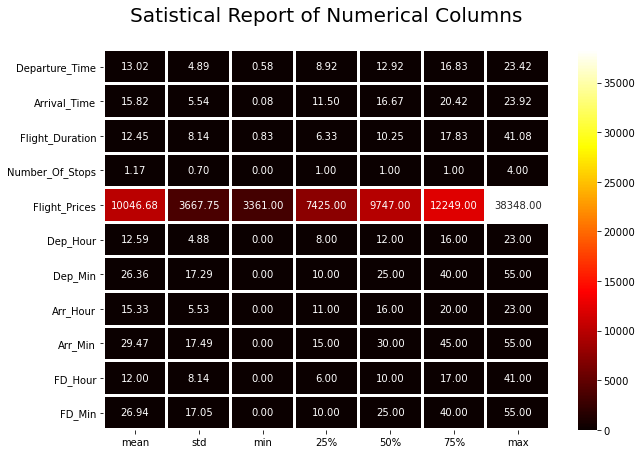

In [20]:
# Visualizing the statistical description of numeric datatype columns

plt.figure(figsize = (10,7))
sns.heatmap(round(df.describe()[1:].transpose(),2), linewidth = 2, annot= True, fmt = ".2f", cmap="hot")
plt.title("Satistical Report of Numerical Columns\n", fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.show()

In the visual representation we have taken into consideration only the numeric data part and can see that the only abnormality is present in our label column "Flight_Prices" which is higher than all the other values.

# Visualization

In [21]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

`pandas-profiling` is an open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code. It generates interactive reports in web format that can be presented to any person, even if they don’t know programming. It also offers report generation for the dataset with lots of features and customizations for the report generated. In short, what `pandas-profiling` does is save us all the work of visualizing and understanding the distribution of each variable. It generates a report with all the information easily available.

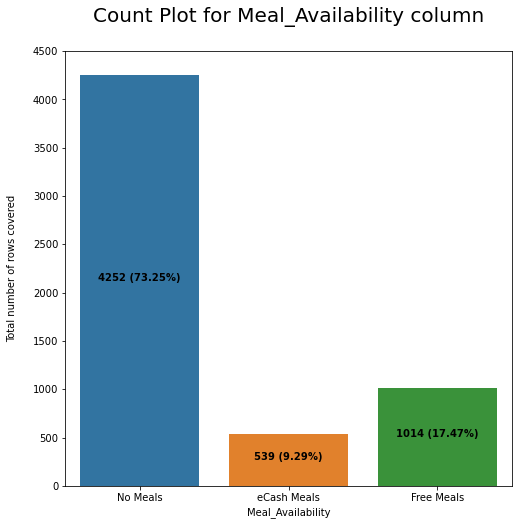

In [22]:
try:
    x = 'Meal_Availability'
    k=0
    plt.figure(figsize=[8,8])
    axes = sns.countplot(df[x])
    for i in axes.patches:
        ht = i.get_height()
        mr = len(df[x])
        st = f"{ht} ({round(ht*100/mr,2)}%)"
        plt.text(k, ht/2, st, ha='center', fontweight='bold')
        k += 1
    plt.ylim(0,4500)
    plt.title(f'Count Plot for {x} column\n', fontsize = 20)
    plt.ylabel(f'Total number of rows covered\n')
    plt.show()
    
except Exception as e:
    print("Error:", e)
    pass

Observation:
- There are 73.25% flights that mostly serve no meals in their domestic journey since they are of short distances and duration
- We can see that 17.47% flights serve free meals which are probably for tickets that include those prices and meal services
- Finally there are 9.29% flights which offer the eCash meals option that can be redeemed to purchase food during long journey flights mostly with multiple stops

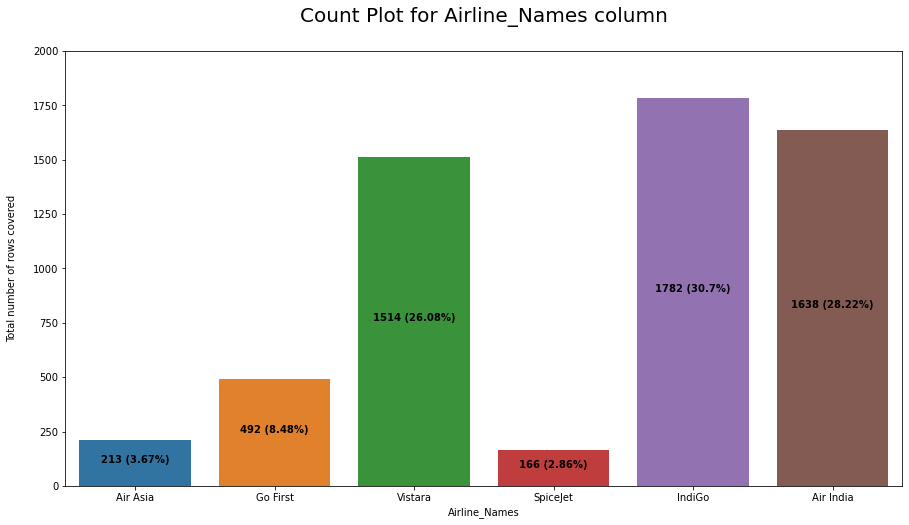

In [23]:
try:
    x = 'Airline_Names'
    k=0
    plt.figure(figsize=[15,8])
    axes = sns.countplot(df[x])
    for i in axes.patches:
        ht = i.get_height()
        mr = len(df[x])
        st = f"{ht} ({round(ht*100/mr,2)}%)"
        plt.text(k, ht/2, st, ha='center', fontweight='bold')
        k += 1
    plt.ylim(0,2000)
    plt.title(f'Count Plot for {x} column\n', fontsize = 20)
    plt.ylabel(f'Total number of rows covered\n')
    plt.show()
    
except Exception as e:
    print("Error:", e)
    pass

Observation:
- Highest number of airline preferred by people are Indigo covering 30.7% of the total record
- We can see that Air India is quite close to the first one and a close competitor standing at the second position holding 28.22% of the total record
- At third place we have Vistara airlines that covers 26.08% of total record in our airline data
- Airlines Go First, Air Asia and SpiceJet are the least used by people covering 8.48%, 3.67% and 2.86% respectively

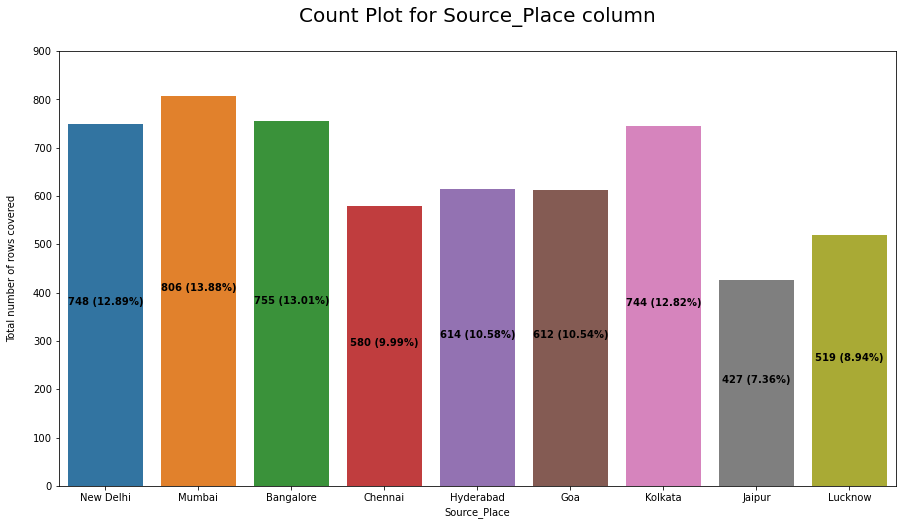

In [24]:
try:
    x = 'Source_Place'
    k=0
    plt.figure(figsize=[15,8])
    axes = sns.countplot(df[x])
    for i in axes.patches:
        ht = i.get_height()
        mr = len(df[x])
        st = f"{ht} ({round(ht*100/mr,2)}%)"
        plt.text(k, ht/2, st, ha='center', fontweight='bold')
        k += 1
    plt.ylim(0,900)
    plt.title(f'Count Plot for {x} column\n', fontsize = 20)
    plt.ylabel(f'Total number of rows covered\n')
    plt.show()
    
except Exception as e:
    print("Error:", e)
    pass

Observation:
- The departure area or source place highly used or people majorly flying from the city is "Mumbai" covering 13.88% record in the column
- We see that "Bangalore" is a close second wherein it covers 13.01% records in the column
- Other two famous locations where people chose to fly from are "New Delhi" and "Kolkata" covering 12.89% and 12.82% respectively
- The least travel from location is "Jaipur" where I believe not many people chose to travel from unless they are returning from a vacation there and hence covers 7.36% of record in the column

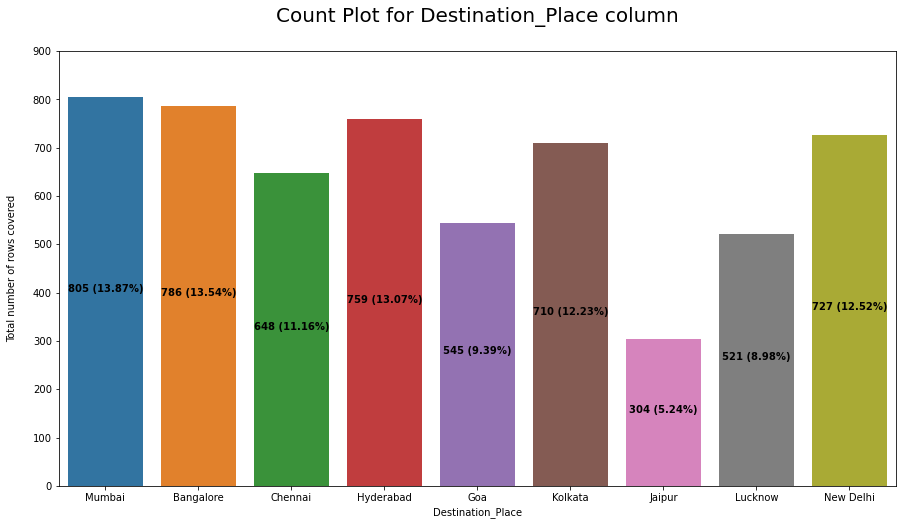

In [25]:
try:
    x = 'Destination_Place'
    k=0
    plt.figure(figsize=[15,8])
    axes = sns.countplot(df[x])
    for i in axes.patches:
        ht = i.get_height()
        mr = len(df[x])
        st = f"{ht} ({round(ht*100/mr,2)}%)"
        plt.text(k, ht/2, st, ha='center', fontweight='bold')
        k += 1
    plt.ylim(0,900)
    plt.title(f'Count Plot for {x} column\n', fontsize = 20)
    plt.ylabel(f'Total number of rows covered\n')
    plt.show()
    
except Exception as e:
    print("Error:", e)
    pass

Observation:
- Just as in case of departure area even in terms of arrival area or destination place people prefer to fly towards the city "Mumbai" covering 13.87% of record
- Again in a similar fashion "Bangalore" city is a close second destination that people like to fly towards covering 13.54% record in the column
- Surprisingly we have "Hyderabad" city taking the third place for destination that people pefer landing covering 13.07% of record
- Finally similar to the departure location the least travel to area is "Jaipur" and it covers 5.24% record in the column

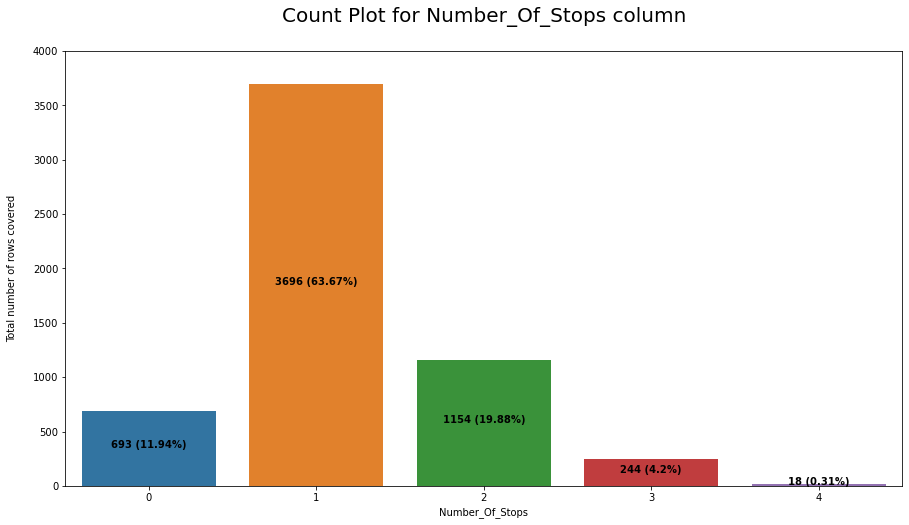

In [26]:
try:
    x = 'Number_Of_Stops'
    k=0
    plt.figure(figsize=[15,8])
    axes = sns.countplot(df[x])
    for i in axes.patches:
        ht = i.get_height()
        mr = len(df[x])
        st = f"{ht} ({round(ht*100/mr,2)}%)"
        plt.text(k, ht/2, st, ha='center', fontweight='bold')
        k += 1
    plt.ylim(0,4000)
    plt.title(f'Count Plot for {x} column\n', fontsize = 20)
    plt.ylabel(f'Total number of rows covered\n')
    plt.show()
    
except Exception as e:
    print("Error:", e)
    pass

Observation:
- People gnerally buy flight tickets that have 1 stop layover covering 63.67% rows in the column
- Next in line are 2 stop layovers which cover 19.88% rows 
- Here we can see that the 0 stop flights availability is around 11.94% of the total record
- In domestic flight we rarely see 3 or 4 stop layovers and therefore they cover 4.2% and 0.31% of total rows in the column respectively

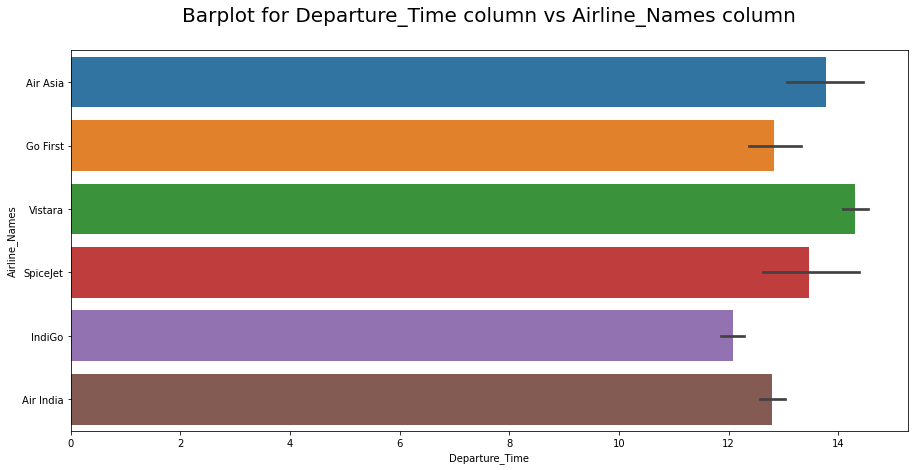

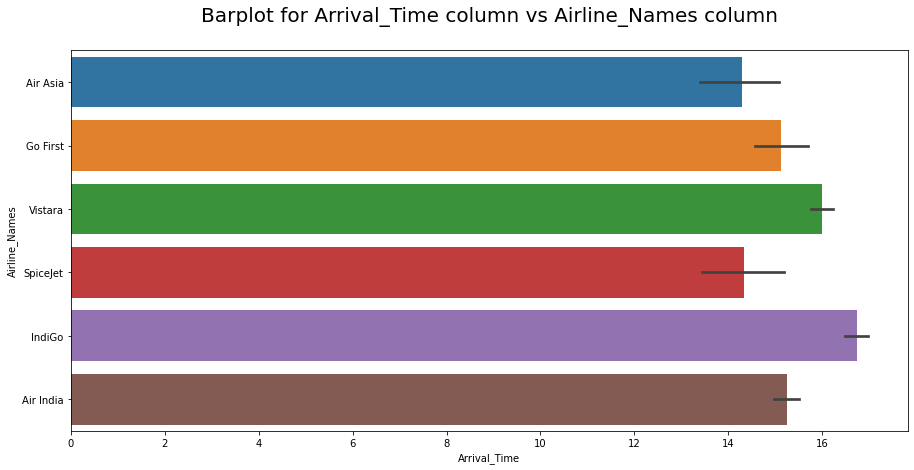

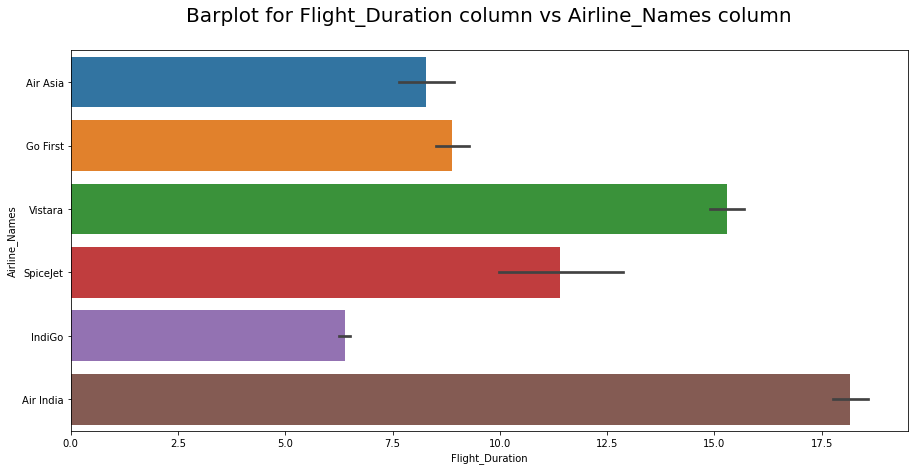

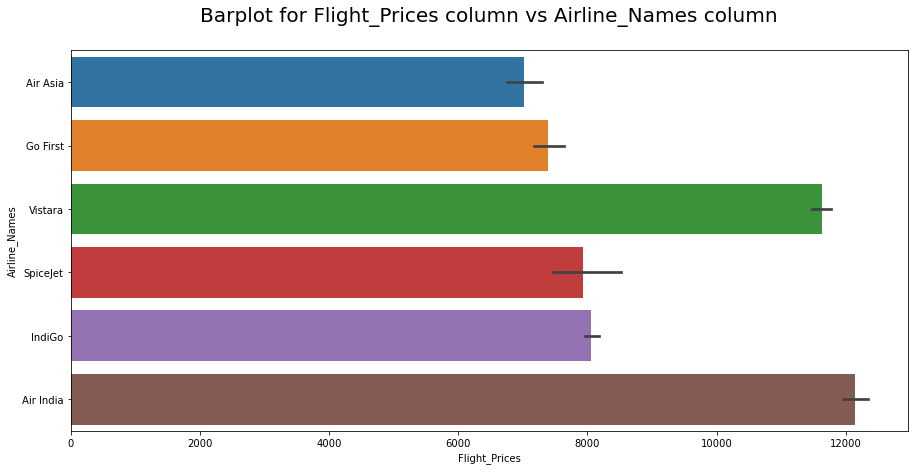

In [27]:
y = 'Airline_Names'

x = 'Departure_Time'
plt.figure(figsize=[15,7])
sns.barplot(x,y,data=df,orient='h')
plt.title(f"Barplot for {x} column vs {y} column\n", fontsize = 20)
plt.show()

x = 'Arrival_Time'
plt.figure(figsize=[15,7])
sns.barplot(x,y,data=df,orient='h')
plt.title(f"Barplot for {x} column vs {y} column\n", fontsize = 20)
plt.show()

x = 'Flight_Duration'
plt.figure(figsize=[15,7])
sns.barplot(x,y,data=df,orient='h')
plt.title(f"Barplot for {x} column vs {y} column\n", fontsize = 20)
plt.show()

x = 'Flight_Prices'
plt.figure(figsize=[15,7])
sns.barplot(x,y,data=df,orient='h')
plt.title(f"Barplot for {x} column vs {y} column\n", fontsize = 20)
plt.show()

Observation:
- When we observe the barplot for Departure time vs Airline we can see that Air Asia has the highest departure time while IndiGo has the lowest departure time
- Considering the barplot for Arrival time vs Airline we can see that IndiGo has the highest arrival time while Air Asia and SpiceJet have the lowest arrival time
- Taking a look at the barplot for Flight duration vs Airline we observe that Ai India has the highest flight duration while Indigo has the lowest flight duration collectively
- Comparing the barplots for Flight prices vs Airline we can clearly see that Vistara and Air India have very high flight prices while the other airlines IndiGo, SpiceJet, Go First and Air Asia lie in a similar price bracket where Air Asia has the lowest fare

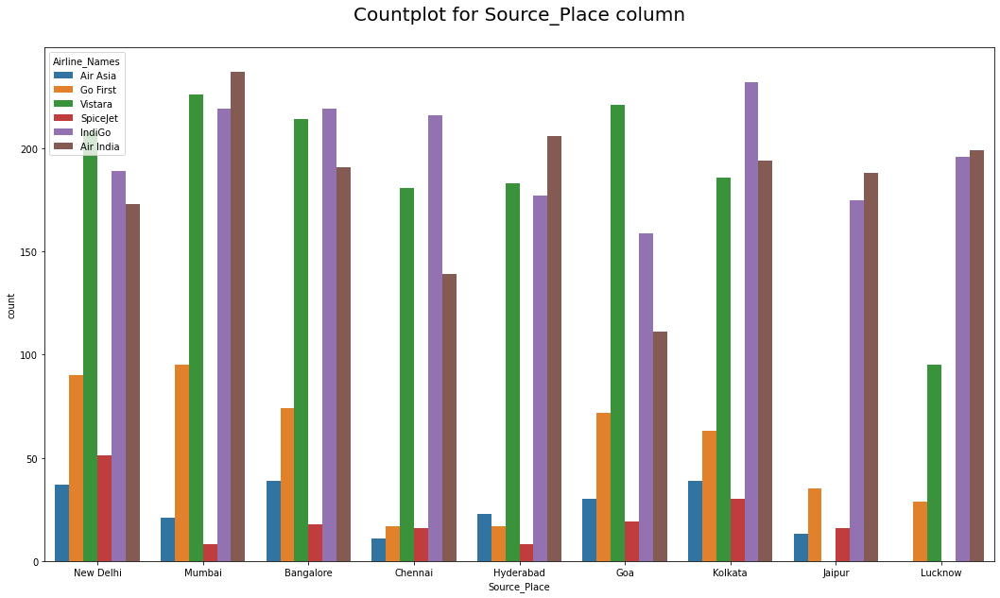

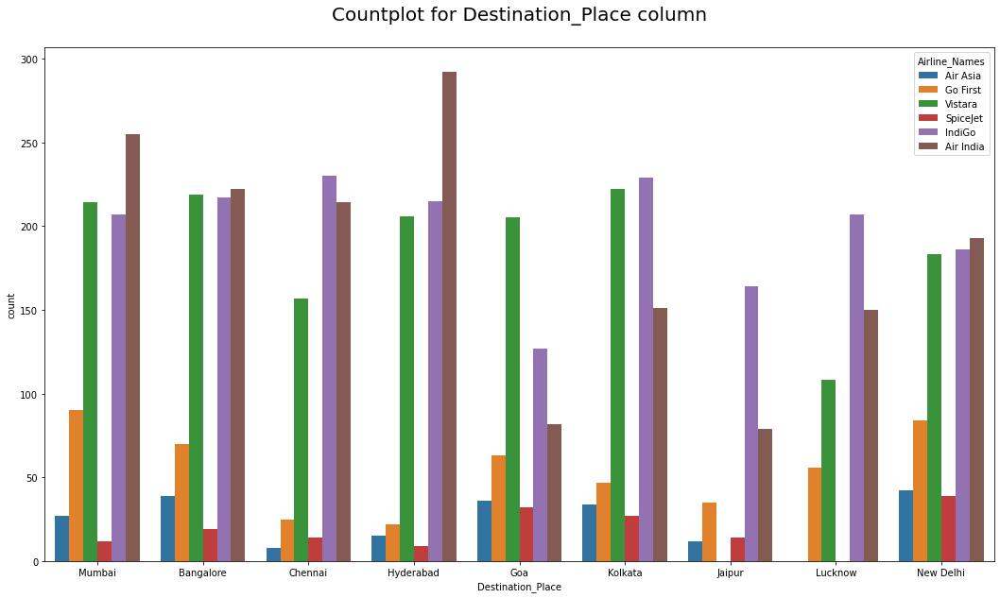

In [28]:
x = "Source_Place"
plt.figure(figsize=(18,10))
sns.countplot(x = x, hue = "Airline_Names", data = df)
plt.title(f"Countplot for {x} column\n", fontsize = 20)
plt.show()

x = "Destination_Place"
plt.figure(figsize=(18,10))
sns.countplot(x = x, hue = "Airline_Names", data = df)
plt.title(f"Countplot for {x} column\n", fontsize = 20)
plt.show()

Observation:
- Checking out the Source place details for each and every airline we can see that Mumbai city has the highest number of departure flights for Air India airlines
- Go First, Indigo and Air India are the airlines that are used in almost all the cities to depart while the other airlines do not cover some or the other city
- Looking at the Destination place details for each and every airline we can see that Hyderabad city has the highest number of arrival flights for Air India airlines
- Once again we can observe that Go First, Indigo and Air India are the leading airlines that are used in almost all cities to arrive while the other airlines miss out on some or the other regions
- Overall I can notice that Air India and Indigo flights do quite well and can be used for arrival and departure to and from any location in India

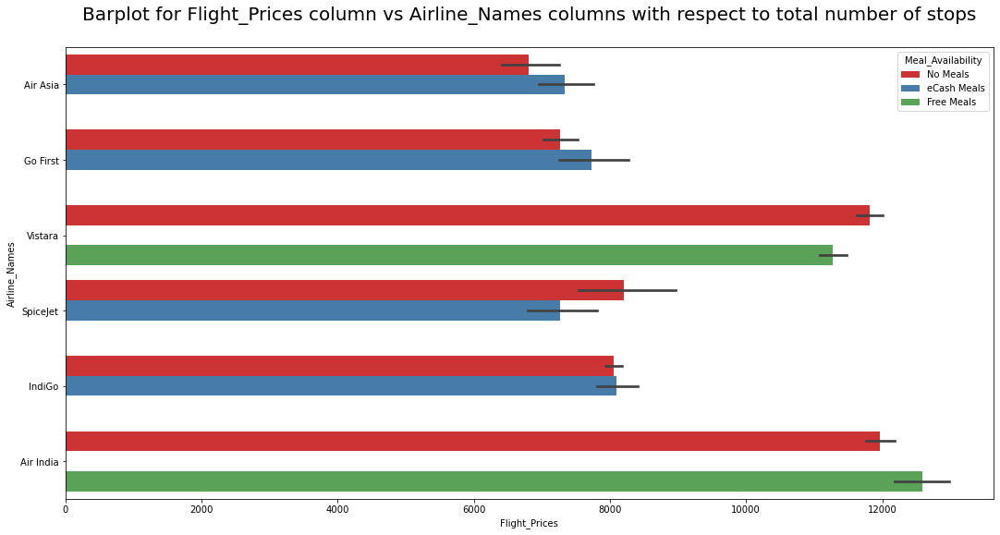

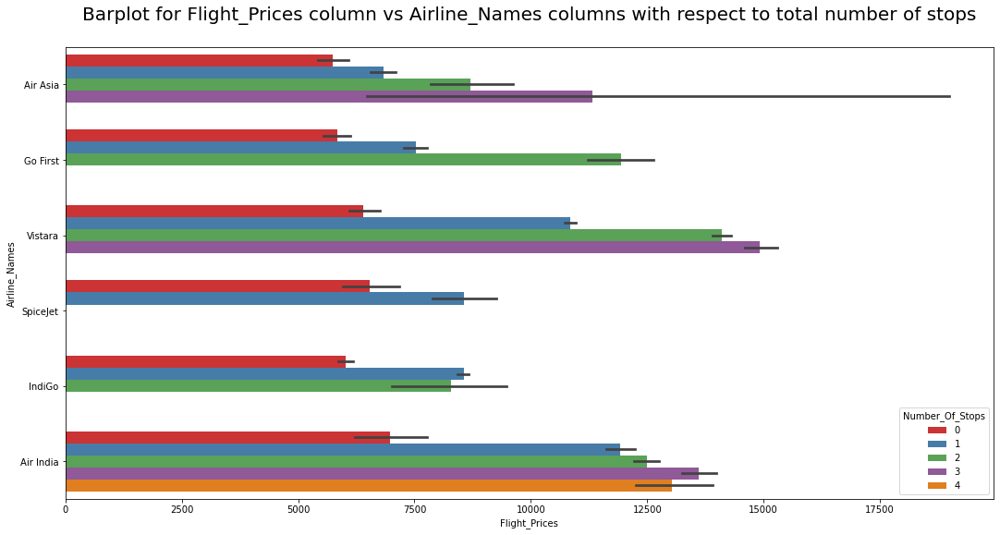

In [29]:
x = "Flight_Prices"
y = "Airline_Names"

plt.figure(figsize=(18,9))
sns.barplot(x=df[x], y=df[y], hue=df['Meal_Availability'], palette="Set1")
plt.title(f"Barplot for {x} column vs {y} columns with respect to total number of stops\n", fontsize = 20)
plt.show()

plt.figure(figsize=(18,9))
sns.barplot(x=df[x], y=df[y], hue=df['Number_Of_Stops'], palette="Set1")
plt.title(f"Barplot for {x} column vs {y} columns with respect to total number of stops\n", fontsize = 20)
plt.show()

Observation:
- Vistara and Air India are the only airlines that have free meal service on their flights but also have a very high no meal record
- Also the eCash meal options do not work for Vistara and Air India flights and they have very high flight prices compared to their competitors
- If we see a trend the flights with 0 stops or rather direct flights for every airline is cheaper when compared to 1 or more layovers
- Also flights with 2 and 3 stops have a considerably high price and number of flights available in those records are high too
- Only Air India provides flights with 4 stop layover even in a domestic environment
- SpiceJet on the other hand only has flights available with 0 and 1 stop layovers

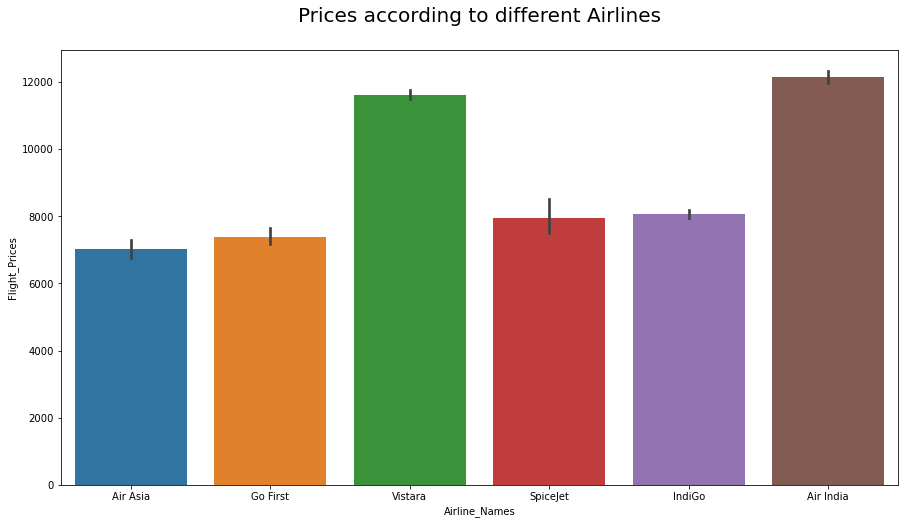

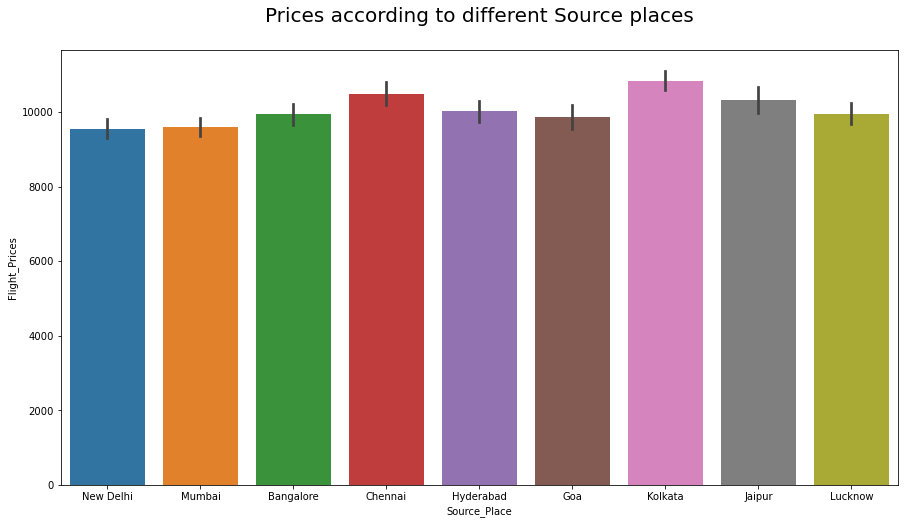

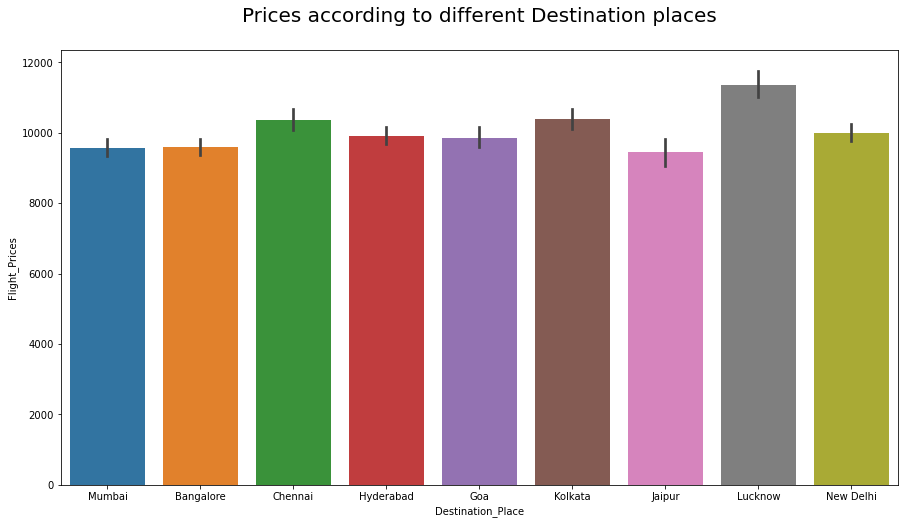

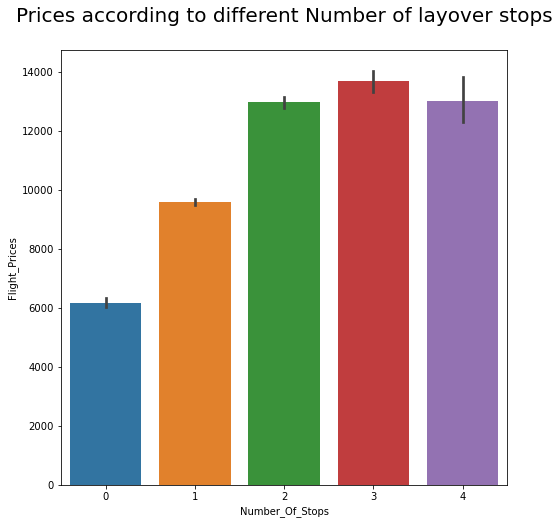

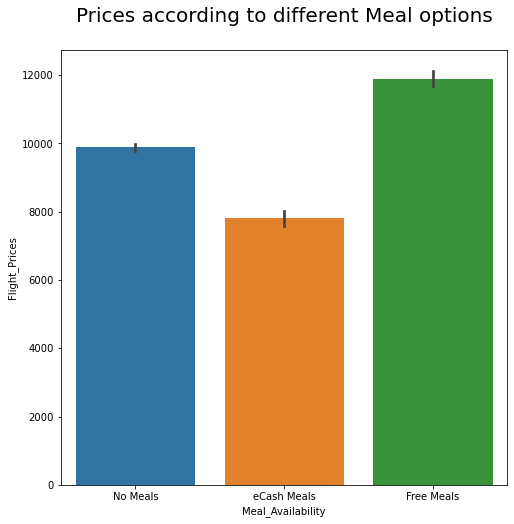

In [30]:
y = "Flight_Prices"

x = "Airline_Names"
plt.figure(figsize = (15,8))
sns.barplot(data = df, y = y, x = x)
plt.title("Prices according to different Airlines\n", fontsize = 20)
plt.show()

x = "Source_Place"
plt.figure(figsize = (15,8))
sns.barplot(data = df, y = y, x = x)
plt.title("Prices according to different Source places\n", fontsize = 20)
plt.show()

x = "Destination_Place"
plt.figure(figsize = (15,8))
sns.barplot(data = df, y = y, x = x)
plt.title("Prices according to different Destination places\n", fontsize = 20)
plt.show()

x = "Number_Of_Stops"
plt.figure(figsize = (8,8))
sns.barplot(data = df, y = y, x = x)
plt.title("Prices according to different Number of layover stops\n", fontsize = 20)
plt.show()

x = "Meal_Availability"
plt.figure(figsize = (8,8))
sns.barplot(data = df, y = y, x = x)
plt.title("Prices according to different Meal options\n", fontsize = 20)
plt.show()

Observation:
- Airfares in Vistara and Air India are pretty high when compared to other airlines as they provide free meal service which probably is just meal cost included in the tickets
- Flight prices when departing from cities like Kolkata and Chennai have higher price range but the others are around the similar range a bit lesser in pricing but not providing a huge difference as such
- Similarly prices when arriving from cities Kolkata and Chennai have high price range however the highest recorded is for Lucknow city and the rest fall in similar price bracket again not making any huge difference in savings
- When we consider the layovers for pricing situtation then obviously direct flights are cheaper when compared to flights that have 1 or more stops
- As per the data collected we see that free meal service flight tickets cost the highest as compared to no meal service flight tickets and the lowest price observed are for eCash meal service wherein the frequesnt flyers can use their flight points as discounts on the ticket prices

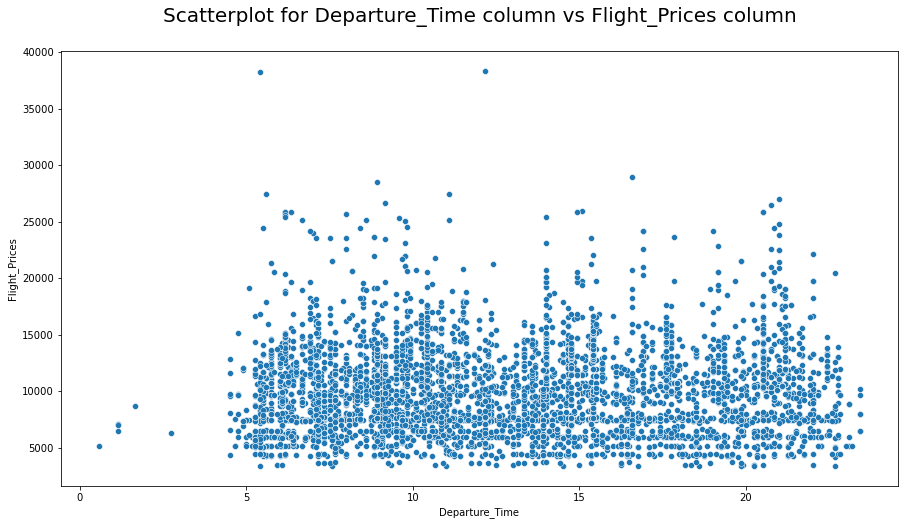

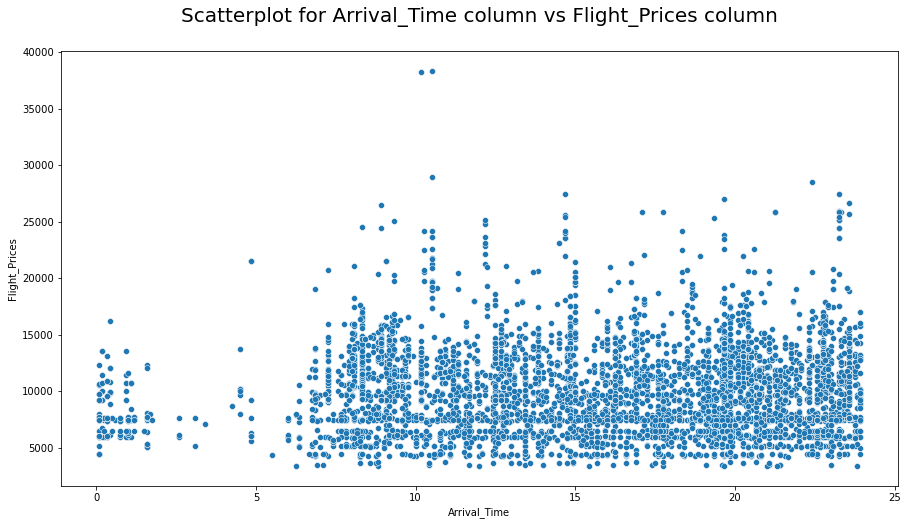

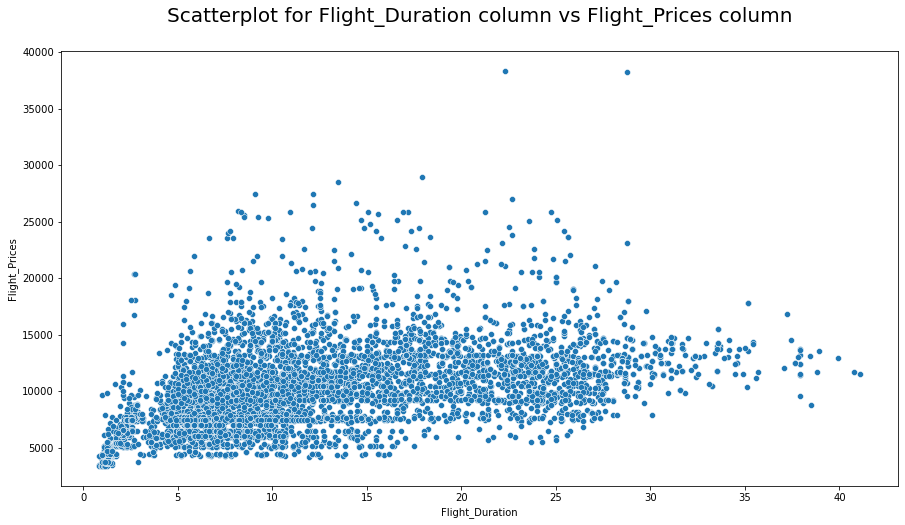

In [31]:
y = "Flight_Prices"

x = "Departure_Time"
plt.figure(figsize = (15,8))
sns.scatterplot(x=x,y=y,data=df)
plt.title(f"Scatterplot for {x} column vs {y} column\n", fontsize = 20)
plt.show()

x = "Arrival_Time"
plt.figure(figsize = (15,8))
sns.scatterplot(x=x,y=y,data=df)
plt.title(f"Scatterplot for {x} column vs {y} column\n", fontsize = 20)
plt.show()

x = "Flight_Duration"
plt.figure(figsize = (15,8))
sns.scatterplot(x=x,y=y,data=df)
plt.title(f"Scatterplot for {x} column vs {y} column\n", fontsize = 20)
plt.show()

Observation:
- In the above scatter plot we see the comparison where flight prices are the highest during peak hours as compared to late hours or specifically graveyard timings for departure
- We can see a similar trend in flight price scatter plot details when it comes to arrival timings where we see a decrease in prices between 1:00 hrs and 6:00 hrs
- Finally as the overall flight duration increases the flight prices increase too and that makes direct flight depart and arrive in a relatively shorter period of time

*************************************** Pair Plot with Meal Type Legend ***************************************


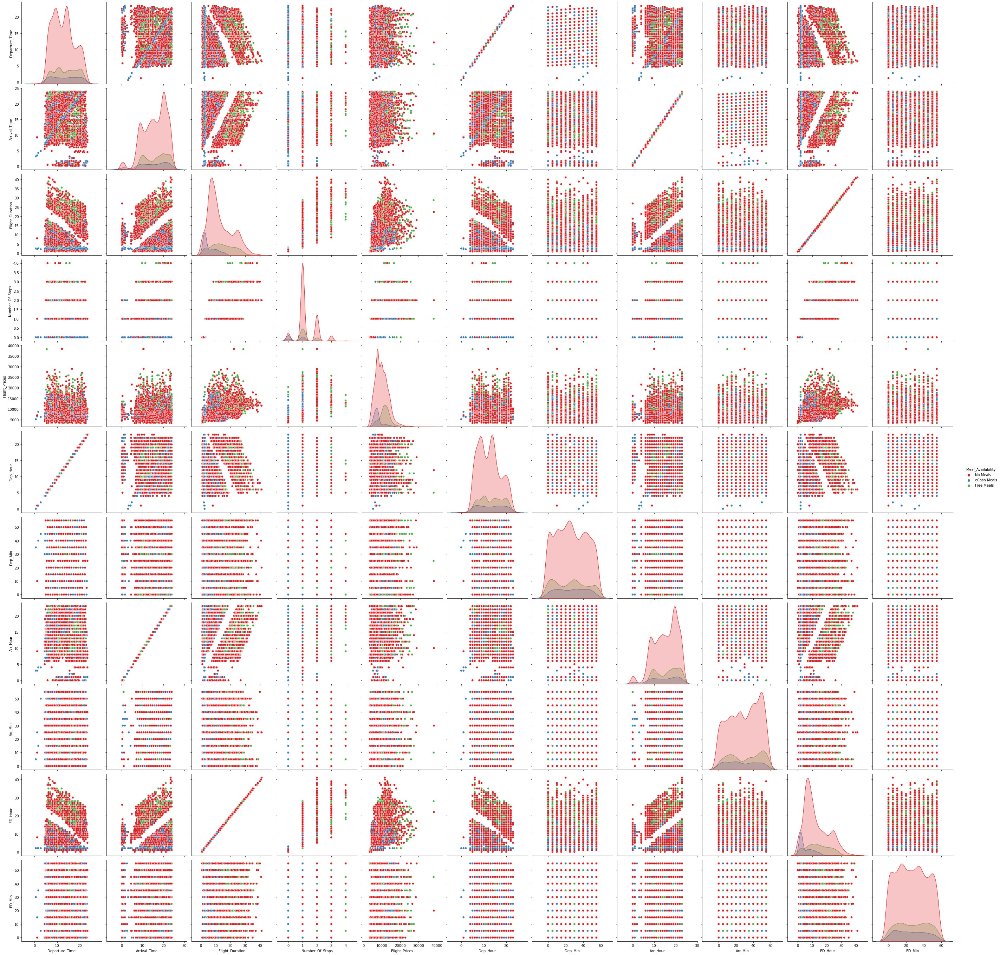

In [32]:
print("*************************************** Pair Plot with Meal Type Legend ***************************************")
sns.pairplot(df, hue='Meal_Availability', diag_kind="kde", kind="scatter", palette="Set1", height=3.5)
plt.show()

Observation: 
- Above we have generated pair plots for Meal Type legend considering all the numeric data.

# Encoding the categorical object datatype columns

In [33]:
# Ordinal Encoder

oe = OrdinalEncoder()
def ordinal_encode(df, column):
    df[column] = oe.fit_transform(df[column])
    return df

column=["Meal_Availability", "Airline_Names", "Source_Place", "Destination_Place"]
df=ordinal_encode(df, column)
df

,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices,Dep_Hour,Dep_Min,Arr_Hour,Arr_Min,FD_Hour,FD_Min
0,0.0,12.666667,20.250000,7.583333,8.0,7.0,1.0,1,5953.0,12,40,20,15,7.0,35.0
1,0.0,11.916667,20.250000,8.333333,8.0,7.0,1.0,1,5953.0,11,55,20,15,8.0,20.0
2,0.0,16.250000,6.333333,14.083333,8.0,7.0,1.0,1,5953.0,16,15,6,20,14.0,5.0
3,2.0,18.833333,20.750000,1.916667,8.0,7.0,1.0,0,5954.0,18,50,20,45,1.0,55.0
4,2.0,9.083333,11.083333,2.000000,8.0,7.0,1.0,0,5954.0,9,5,11,5,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5800,1.0,8.916667,8.333333,23.416667,6.0,4.0,1.0,1,9302.0,8,55,8,20,23.0,25.0
5801,1.0,8.916667,9.333333,24.416667,6.0,4.0,1.0,2,16287.0,8,55,9,20,24.0,25.0
5802,1.0,14.750000,9.333333,18.583333,6.0,4.0,1.0,2,16865.0,14,45,9,20,18.0,35.0
5803,1.0,8.916667,9.333333,24.416667,6.0,4.0,1.0,2,16865.0,8,55,9,20,24.0,25.0


I defined a function to apply `OrdinalEncoder` on my feature columns to convert the object datatype columns to numeric format.

In [34]:
print("Shape of our data frame post encoding shows {} Rows and {} columns\n".format(df.shape[0], df.shape[1]))
df

Shape of our data frame post encoding shows 5805 Rows and 15 columns



,Airline_Names,Departure_Time,Arrival_Time,Flight_Duration,Source_Place,Destination_Place,Meal_Availability,Number_Of_Stops,Flight_Prices,Dep_Hour,Dep_Min,Arr_Hour,Arr_Min,FD_Hour,FD_Min
0,0.0,12.666667,20.250000,7.583333,8.0,7.0,1.0,1,5953.0,12,40,20,15,7.0,35.0
1,0.0,11.916667,20.250000,8.333333,8.0,7.0,1.0,1,5953.0,11,55,20,15,8.0,20.0
2,0.0,16.250000,6.333333,14.083333,8.0,7.0,1.0,1,5953.0,16,15,6,20,14.0,5.0
3,2.0,18.833333,20.750000,1.916667,8.0,7.0,1.0,0,5954.0,18,50,20,45,1.0,55.0
4,2.0,9.083333,11.083333,2.000000,8.0,7.0,1.0,0,5954.0,9,5,11,5,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5800,1.0,8.916667,8.333333,23.416667,6.0,4.0,1.0,1,9302.0,8,55,8,20,23.0,25.0
5801,1.0,8.916667,9.333333,24.416667,6.0,4.0,1.0,2,16287.0,8,55,9,20,24.0,25.0
5802,1.0,14.750000,9.333333,18.583333,6.0,4.0,1.0,2,16865.0,14,45,9,20,18.0,35.0
5803,1.0,8.916667,9.333333,24.416667,6.0,4.0,1.0,2,16865.0,8,55,9,20,24.0,25.0


Checking the number of rows and columns after applying the encoding technique on them.

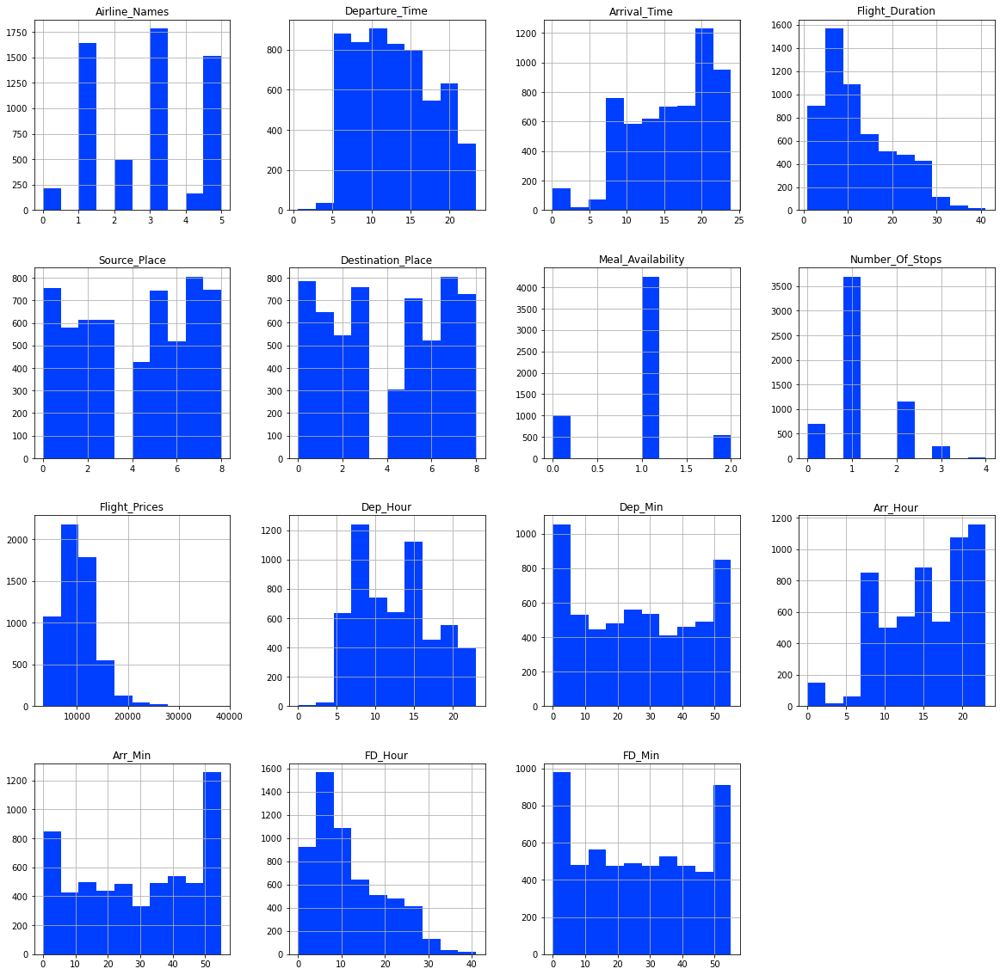

In [35]:
plt.style.use('seaborn-bright')

df.hist(figsize=(20,20))
plt.show()

With the help of above histogram we are able to see the data distribution for our dataset columns.

# Correlation using a Heatmap

- Positive correlation - A correlation of +1 indicates a perfect positive correlation, meaning that both variables move in the same direction together.
- Negative correlation - A correlation of –1 indicates a perfect negative correlation, meaning that as one variable goes up, the other goes down.

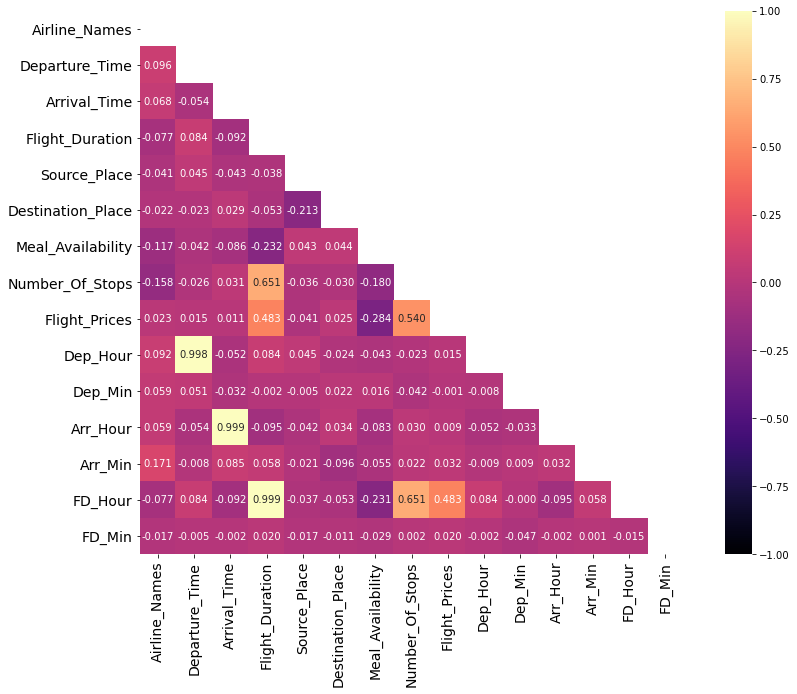

In [36]:
upper_triangle = np.triu(df.corr())
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':10}, cmap="magma", mask=upper_triangle)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In the above correlation heatmap we can see that only "Source_Place" and "Meal_Availability" are negatively correlated with our label column while the other feature columns are positively correlated. Also we see no multi collinearity concerns between the feature variables and will not have to worry about the same.

# Correlation Bar Plot comparing target column with the feature columns

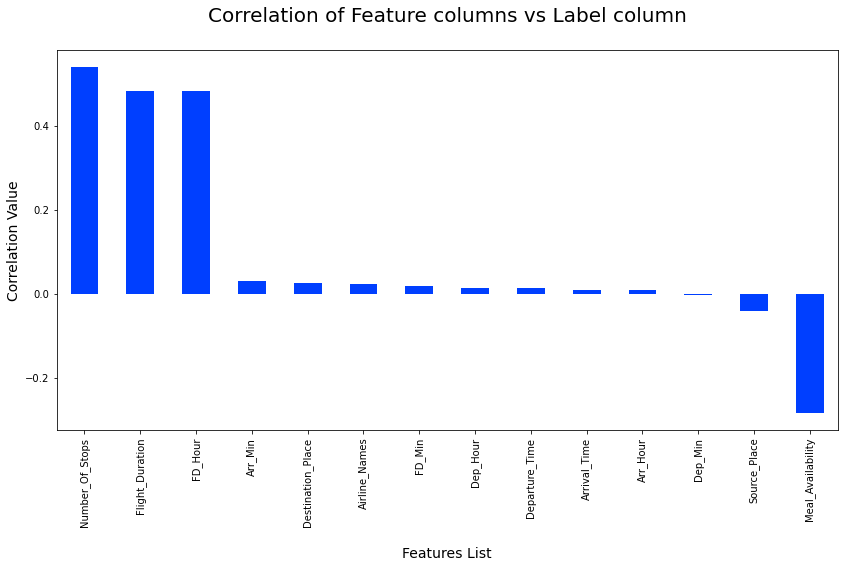

In [37]:
df_corr = df.corr()
plt.figure(figsize=(14,7))
df_corr['Flight_Prices'].sort_values(ascending=False).drop('Flight_Prices').plot.bar()
plt.title("Correlation of Feature columns vs Label column\n", fontsize=20)
plt.xlabel("\nFeatures List", fontsize=14)
plt.ylabel("Correlation Value", fontsize=14)
plt.show()

Here we have a visual on the positively and negatively correlated feature columns with our target variable.

### Outliers

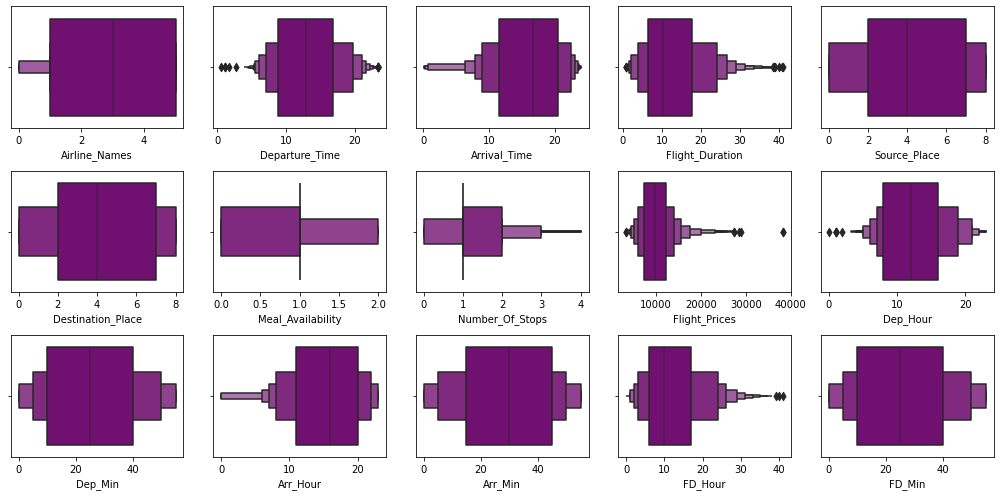

In [38]:
plt.figure(figsize=(14,7))
outl_df = df.columns.values
for i in range(0, len(outl_df)):
    plt.subplot(3, 5, i+1)
    ax = sns.boxenplot(df[outl_df[i]], color='purple')
    plt.tight_layout()

Observation:
- We can see that columns "Departure_Time" and "Flight_Duration" have some outliers however since they are both datetime features we won't have to worry about the outliers here.
- Similarly the outliers reflecting in our target column "Flight_Prices" are of no concern either.
- Here we will not worry about the outlier issue therefore won't have to deal with one either.

### Skewness

In [39]:
df.skew()

Airline_Names        0.097880
Departure_Time       0.214262
Arrival_Time        -0.544907
Flight_Duration      0.736637
Source_Place        -0.069663
Destination_Place   -0.024310
Meal_Availability   -0.129523
Number_Of_Stops      0.721570
Flight_Prices        1.055364
Dep_Hour             0.221858
Dep_Min              0.059660
Arr_Hour            -0.526934
Arr_Min             -0.142671
FD_Hour              0.736539
FD_Min               0.041972
dtype: float64

With the `skew` method we see that there are columns present in our dataset that are above the acceptable range of +/-0.5 value.

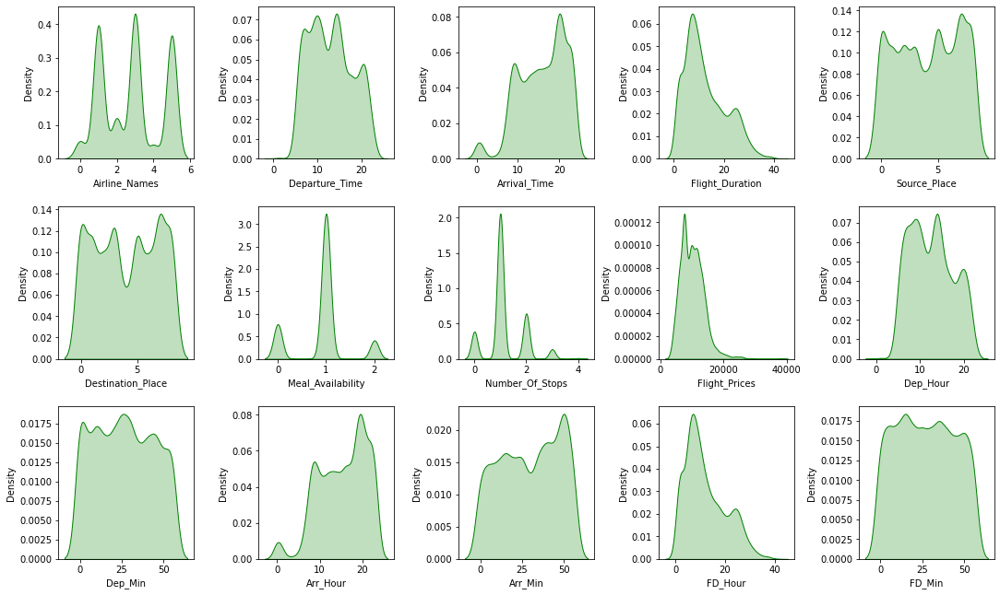

In [40]:
fig, ax = plt.subplots(ncols=5, nrows=3, figsize=(15,9))
index = 0
ax = ax.flatten()
for col, value in df.items():
    sns.distplot(value, ax=ax[index], hist=False, color="g", kde_kws={"shade": True})
    index += 1
plt.tight_layout(pad=0.8, w_pad=0.8, h_pad=2.0)
plt.show()

Observation:
- As most of the feature columns are categorical data we will not worry about the bell shape curve formation
- We see that our target label "Flight_Prices" has some right skewness but we will not bother achieving any normal distribution pattern for just the continous label column
- Since most of the columns are already prettry much retaining individual bell shape curves and forming normal distribution we won't have to worry about skewness concerns

# Splitting the dataset into 2 variables namely 'X' and 'Y' for feature and label

In [41]:
X = df.drop('Flight_Prices', axis=1)
Y = df['Flight_Prices']

I have bifurcated the dataset into features and labels where X represents all the feature columns and Y represents the target label column.

# Finding the best random state for building Regression Models

In [42]:
maxAccu=0
maxRS=0

for i in range(1, 1000):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=i)
    lr=LinearRegression()
    lr.fit(X_train, Y_train)
    pred = lr.predict(X_test)
    r2 = r2_score(Y_test, pred)
    
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i

print("Best R2 score is", maxAccu*100,"on Random State", maxRS)

Best R2 score is 41.30962845018751 on Random State 638


Here we see that out of the random state value ranging from 1 to 1000 the best random state number found is "638" and we will use this in our ML models.

# Feature importance bar graph

,Importance
Features,
Number_Of_Stops,0.228
Flight_Duration,0.163
Meal_Availability,0.089
Airline_Names,0.088
Destination_Place,0.067
Source_Place,0.063
Departure_Time,0.059
Arrival_Time,0.057
Dep_Min,0.047


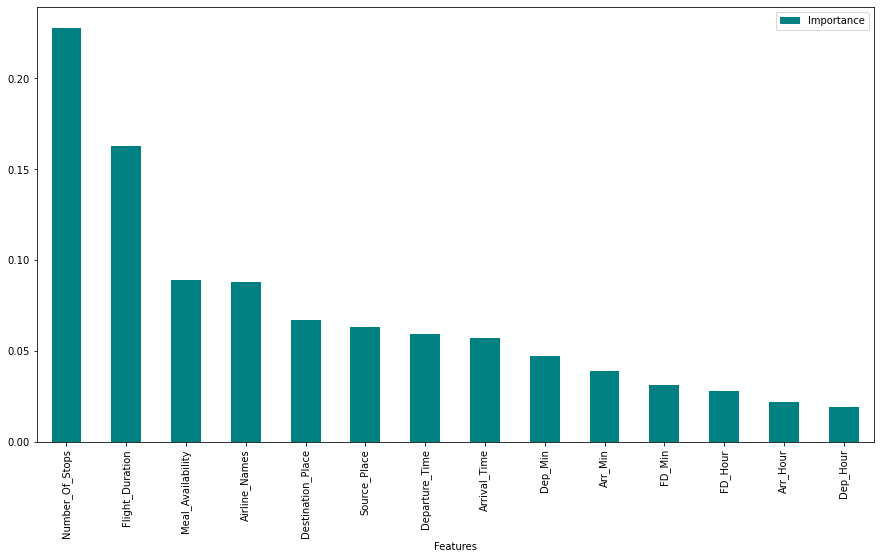

In [43]:
rf=RandomForestRegressor()
rf.fit(X_train, Y_train)
importances = pd.DataFrame({'Features':X.columns, 'Importance':np.round(rf.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
plt.rcParams["figure.figsize"] = (15,8)
importances.plot.bar(color='teal')
importances

In the above cell we can the columns arranged in descending order as per their importance weightage while predicting our label variable.

# Machine Learning Model for Regression with Evaluation Metrics

In [44]:
# Regression Model Function

def reg(model, X, Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=638)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting Y_test
    pred = model.predict(X_test)
    
    # RMSE - a lower RMSE score is better than a higher one
    rmse = mean_squared_error(Y_test, pred, squared=False)
    print("RMSE Score is:", rmse)
    
    # R2 score
    r2 = r2_score(Y_test, pred, multioutput='variance_weighted')*100
    print("R2 Score is:", r2)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, X, Y, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of r2 score minus cv score
    result = r2 - cv_score
    print("R2 Score - Cross Validation Score is", result)

I have built a regression function that splits the training and testing features and labels, then trains the model, predicts the label, calculates the RMSE score, generates the R2 score, calculates the Cross Validation score and finally finds the difference between the R2 score and Cross Validation score.

In [45]:
# Linear Regression Model

model=LinearRegression()
reg(model, X, Y)

RMSE Score is: 2741.9142718035005
R2 Score is: 41.30962845018751
Cross Validation Score: 33.96122010005579
R2 Score - Cross Validation Score is 7.34840835013172


Created the linear regression model and checked for all it's evaluation metrics as well.

In [46]:
# Ridge Regularization

model=Ridge(alpha=1e-2, normalize=True)
reg(model, X, Y)

RMSE Score is: 2743.4497644670982
R2 Score is: 41.243875943318095
Cross Validation Score: 33.96445373909678
R2 Score - Cross Validation Score is 7.279422204221312


Created the ridge regression model and checked for all it's evaluation metrics as well.

In [47]:
# Lasso Regularization

model=Lasso(alpha=1e-2, normalize=True, max_iter=1e5)
reg(model, X, Y)

RMSE Score is: 2742.032210252989
R2 Score is: 41.304579422683574
Cross Validation Score: 33.960257819050575
R2 Score - Cross Validation Score is 7.344321603632999


Created the lasso regression model and checked for all it's evaluation metrics as well.

In [48]:
# Support Vector Regression

model=SVR(C=1.0, epsilon=0.2, kernel='poly', gamma='auto')
reg(model, X, Y)

RMSE Score is: 2672.5496475016384
R2 Score is: 44.241551832921544
Cross Validation Score: 33.503793956772256
R2 Score - Cross Validation Score is 10.737757876149288


Created the Support Vector Regression model and checked it's evaluation metrics.

In [49]:
# Decision Tree Regressor

model=DecisionTreeRegressor(criterion="poisson", random_state=111)
reg(model, X, Y)

RMSE Score is: 3411.501062644662
R2 Score is: 9.144727246307482
Cross Validation Score: -34.33257186084151
R2 Score - Cross Validation Score is 43.477299107148994


Created the Decision Tree Regressor model and checked it's evaluation metrics.

In [50]:
# Random Forest Regressor

model=RandomForestRegressor(max_depth=2, max_features="sqrt")
reg(model, X, Y)

RMSE Score is: 2907.8981626781324
R2 Score is: 33.98881929228749
Cross Validation Score: 29.838061236856
R2 Score - Cross Validation Score is 4.1507580554314885


Created the Random Forest Regressor model and checked it's evaluation metrics.

In [51]:
# K Neighbors Regressor

KNeighborsRegressor(n_neighbors=2, algorithm='kd_tree')
reg(model, X, Y)

RMSE Score is: 2871.843145107941
R2 Score is: 35.615615782543486
Cross Validation Score: 30.049493049578313
R2 Score - Cross Validation Score is 5.566122732965173


Created the K Neighbors Regressor model and checked it's evaluation metrics.

In [52]:
# Gradient Boosting Regressor

model=GradientBoostingRegressor(loss='quantile', n_estimators=200, max_depth=5)
reg(model, X, Y)

RMSE Score is: 3487.3032811622725
R2 Score is: 5.062333789397055
Cross Validation Score: -4.1067212264258375
R2 Score - Cross Validation Score is 9.169055015822892


Created the Gradient Boosting Regressor model and checked it's evaluation metrics.

In [53]:
# Ada Boost Regressor

model=AdaBoostRegressor(n_estimators=300, learning_rate=1.05, random_state=42)
reg(model, X, Y)

RMSE Score is: 4227.642017872282
R2 Score is: -39.526122771423644
Cross Validation Score: -11.214507216922213
R2 Score - Cross Validation Score is -28.31161555450143


Created the Ada Boost Regressor model and checked it's evaluation metrics.

In [54]:
# Extra Trees Regressor

model=ExtraTreesRegressor(n_estimators=200, max_features='sqrt', n_jobs=6)
reg(model, X, Y)

RMSE Score is: 2049.4608205477957
R2 Score is: 67.21023113030971
Cross Validation Score: 51.851250482055775
R2 Score - Cross Validation Score is 15.358980648253933


Created the Extra Trees Regressor model and checked it's evaluation metrics.

# Hyper parameter tuning

In [55]:
# Choosing Extra Trees Regressor

fmod_param = {'n_estimators' : [100, 200, 300],
              'criterion' : ['squared_error', 'mse', 'absolute_error', 'mae'],
              'n_jobs' : [-2, -1, 1],
              'random_state' : [42, 251, 340]
             }

GSCV = GridSearchCV(ExtraTreesRegressor(), fmod_param, cv=5)
GSCV.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'mse', 'absolute_error',
                                       'mae'],
                         'n_estimators': [100, 200, 300], 'n_jobs': [-2, -1, 1],
                         'random_state': [42, 251, 340]})

After comparing all the regression models I have selected Extra Trees Regressor as my best model and have listed down it's parameters above referring the sklearn webpage. Here I am using the Grid Search CV method for hyper parameter tuning my best model. And I have trained the Grid Search CV with the list of parameters I feel it should check for best possible outcomes.

In [56]:
GSCV.best_params_

{'criterion': 'mae', 'n_estimators': 300, 'n_jobs': -2, 'random_state': 251}

Here the Grid Search CV has provided me with the best parameters list out of all the combinations it used to train the model.

In [57]:
Final_Model = ExtraTreesRegressor(criterion='mae', n_estimators=300, n_jobs=-2, random_state=251)
Model_Training = Final_Model.fit(X_train, Y_train)
fmod_pred = Final_Model.predict(X_test)
fmod_r2 = r2_score(Y_test, fmod_pred, multioutput='variance_weighted')*100
print("R2 score for the Best Model is:", fmod_r2)

R2 score for the Best Model is: 72.4377190016525


I have successfully incorporated the Hyper Parameter Tuning on my Final Model and received the R2 score for it.

# Prediction of Flight Prices

In [58]:
Predicted_Price = Final_Model.predict(X)
# Checking the predicted price details in dataframe format
predicted_output = pd.DataFrame()
predicted_output['Flight Price Predicted'] = Predicted_Price
predicted_output['Flight Price Actual'] = df["Flight_Prices"]
predicted_output

,Flight Price Predicted,Flight Price Actual
0,5953.000000,5953.0
1,5953.000000,5953.0
2,5965.956667,5953.0
3,5590.056667,5954.0
4,5954.086667,5954.0
...,...,...
5800,9284.330000,9302.0
5801,16865.000000,16287.0
5802,16865.000000,16865.0
5803,16865.000000,16865.0


Here we have created a dataframe that shows us the predicted flight prices and the actual flight prices which was obtained by scraping data from the websites.

# Saving the best model

In [59]:
filename = "FlightPricePrediction.pkl"
joblib.dump(Final_Model, filename)

['FlightPricePrediction.pkl']

Finally, I am saving my best regression model using the joblib library.